
# NeuralProphetによる時系列データの予測

> 需要予測パッケージ NeuralProphet を紹介する． 


In [ ]:
#|default_exp neuralprophetf

In [ ]:
#|hide
%reload_ext autoreload
%autoreload 2

In [ ]:
#|hide
from IPython.display import Image, YouTubeVideo

## NeuralProphetとは

[NeuralProphet](https://neuralprophet.com/) は需要予測のためのパッケージである． 

Bayes推論に基づく予測パッケージ [prophet](https://facebook.github.io/prophet/) と機械（深層）学習の橋渡しのために新たに開発されたもので、深層学習パッケージ [PyTorch](https://pytorch.org/) を用いている。

[vega_datasets](https://github.com/altair-viz/vega_datasets)のデータを用いるので，インストールしておく．

In [ ]:
# インストールされていない場合には、以下を生かす。
# !pip install -U neuralprophet
# !pip install -U vega_datasets
# !pip install -U ipywidgets

## 諸パッケージのインポート

NeuralProphetで予測するために必要なパッケージをインポートしておく．


In [ ]:
#|export 
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# エラー以外はログメッセージを抑制
set_log_level("ERROR")

from vega_datasets import data
import plotly.express as px
import plotly

In [ ]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# エラー以外はログメッセージを抑制
set_log_level("ERROR")

from vega_datasets import data
import plotly.express as px
import plotly

## NeuralProphetの基本

NeuralProphetをPythonから呼び出して使う方法は，機械学習パッケージscikit-learnと同じである。


1.   **NeuralProphet**クラスのインスタンス**model**を生成
2.   **fit**メソッドで学習（引数はデータフレーム、返値は評価尺度）
3.   **predict**メソッドで予測（引数は予測したい期間を含んだデータフレーム）

### 例題：Wikiアクセス数

例としてアメリカンフットボールプレーヤのPayton ManningのWikiアクセス数のデータを用いる。

In [ ]:
df = pd.read_csv("http://logopt.com/data/peyton_manning.csv")
df.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


Prophetモデルのインスタンスを生成し，fitメソッドで学習（パラメータの最適化）を行う．fitメソッドに渡すのは，上で作成したデータフレームである．このとき、**ds**(datestamp)列に日付（時刻）を、**y**列に予測したい数値を入れておく必要がある
（この例題では，あらかじめそのように変更されている）．


In [ ]:
model = NeuralProphet()
metrics = model.fit(df)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/236 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

**make_future_dataframe**メソッドで未来の時刻を表すデータフレームを生成する。
既定値では予測で用いた過去の時刻も含まないので、**n_historic_predictions**引数をTrueにして、過去の時刻も入れる。
引数は予測をしたい期間数**periods**であり，ここでは、１年後（365日分）まで予測することにする。

Predicting: 91it [00:00, ?it/s]

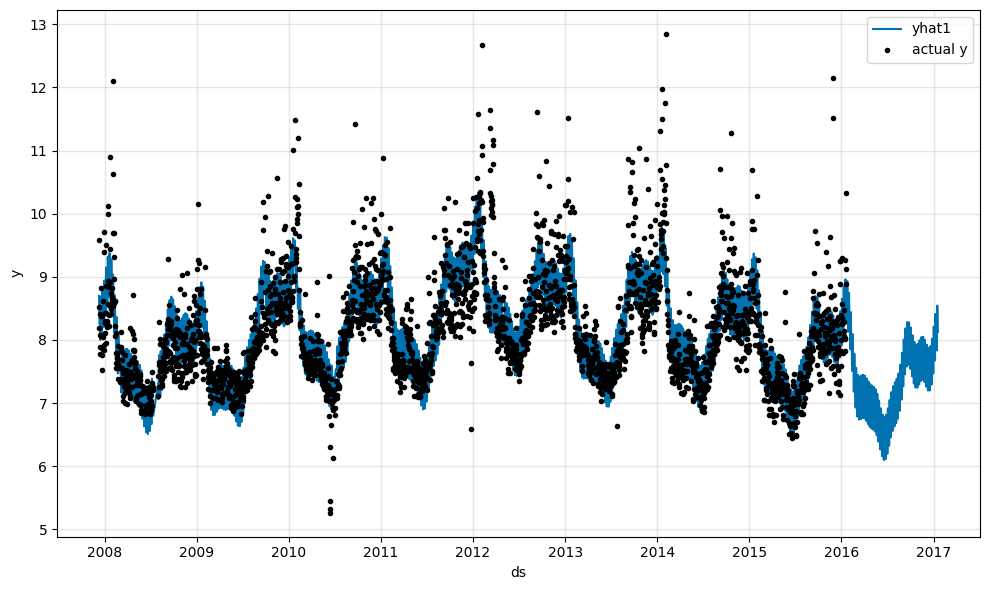

In [ ]:
df_future = model.make_future_dataframe(df, n_historic_predictions=True, periods=365)
forecast = model.predict(df_future)
model.set_plotting_backend("matplotlib") #matplotlibで描画する（既定値はplotly）
model.plot(forecast)

predict メソッドに予測したい時刻を含んだデータフレームfuture を渡すと、予測値を入れたデータフレームforecastを返す。

In [ ]:
forecast.tail()

,ds,y,yhat1,trend,season_yearly,season_weekly
3265,2017-01-15,NaN,8.216602,7.137280,1.036658,0.042665
3266,2017-01-16,NaN,8.550267,7.136175,1.049828,0.364264
3267,2017-01-17,NaN,8.316690,7.135070,1.060175,0.121446
3268,2017-01-18,NaN,8.133187,7.133965,1.067564,-0.068342
3269,2017-01-19,NaN,8.133450,7.132861,1.071885,-0.071296


### 一般化加法モデル

NeuralProphetにおける予測は**一般化加法モデル**を用いて行われる．
これは，傾向変動，季節変動，イベント情報などの様々な因子の和として予測を行う方法である．

$$
 y_t =g_t + s_t + h_t + f_t + a_t + \ell_t + \epsilon_t 
$$

- $y_t$ : 予測値
- $g_t$ : 傾向変動(trend)；傾向変化点ありの区分的線形（アフィン）関数
- $s_t$ : 季節変動；年次，週次，日次の季節変動をsin, cosの組み合わせ（フーリエ級数）で表現
- $h_t$ : 休日などのイベント項
- $f_t$: 外生変数に対する回帰項
- $a_t$: 自己回帰項（時間遅れ（ラグ）を指定する）
- $\ell_t$: 時間遅れ（ラグ）付きの外生変数に対する回帰項
- $\epsilon_t$ : 誤差項

因子ごとに予測値の描画を行うには，plot_componentsメソッドを用いる．既定では，以下のように，上から順に傾向変動，年次の季節変動、週次の季節変動が描画される．また，傾向変動の図（一番上）には，予測の誤差範囲が示される．季節変動の誤差範囲を得る方法については，後述する．


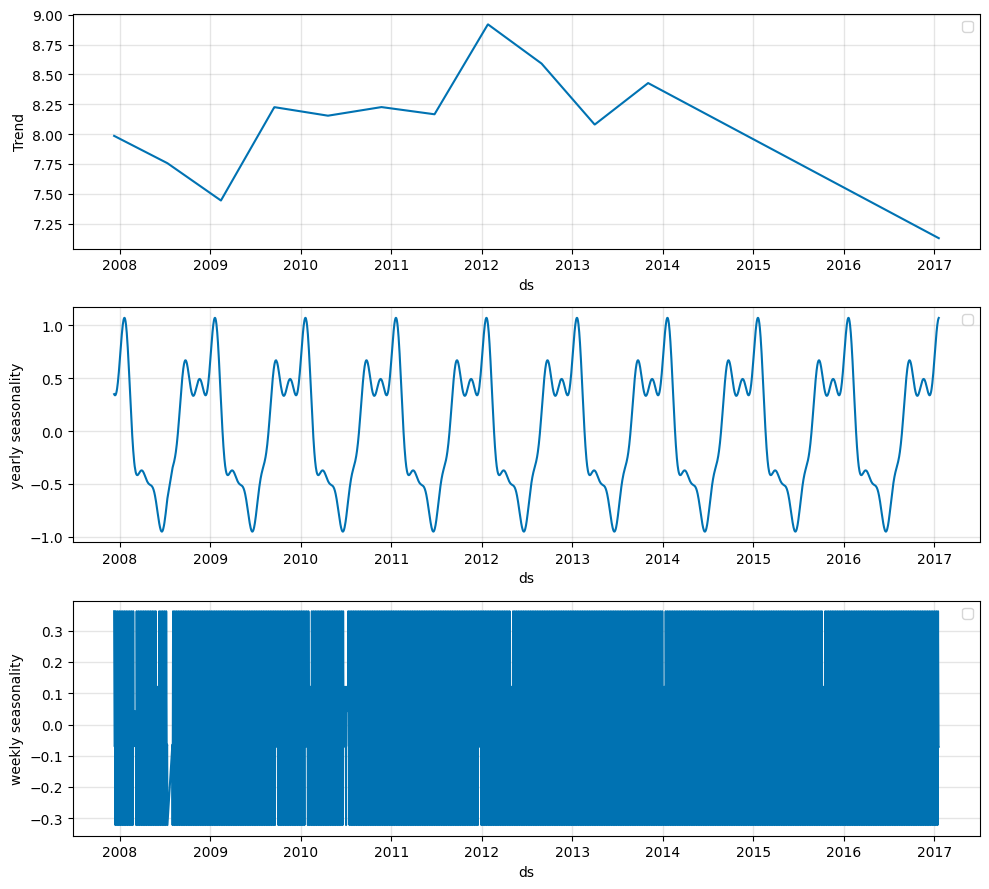

In [ ]:
model.plot_components(forecast)

対話形式に，拡大縮小や範囲指定ができる動的な図も，Plotlyライブラリを用いて得ることができる．

In [ ]:
model.set_plotting_backend("plotly") 
fig = model.plot(forecast)
#plotly.offline.plot(fig);

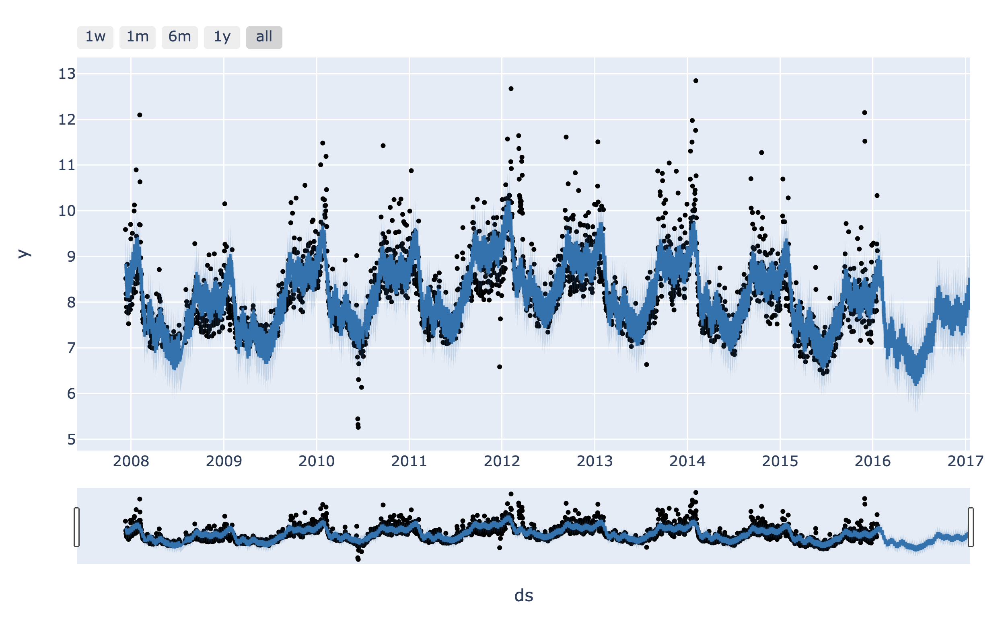

In [ ]:
#|echo: false
Image("../figure/prophet1.PNG", width=700, height=400)

In [ ]:
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial04.csv")
df.head()

,ds,y,temperature
0,2015-01-01,64.92,277.00
1,2015-01-02,58.46,277.95
2,2015-01-03,63.35,278.83
3,2015-01-04,50.54,279.64
4,2015-01-05,64.89,279.05


###  例題： $CO_2$ 排出量のデータ

データライブラリから二酸化炭素排出量のデータを読み込み，Plotly Expressで描画する．

In [ ]:
co2 = data.co2_concentration()
co2.head()

,Date,CO2
0,1958-03-01,315.70
1,1958-04-01,317.46
2,1958-05-01,317.51
3,1958-07-01,315.86
4,1958-08-01,314.93


In [ ]:
fig = px.line(co2,x="Date",y="CO2")
#plotly.offline.plot(fig);

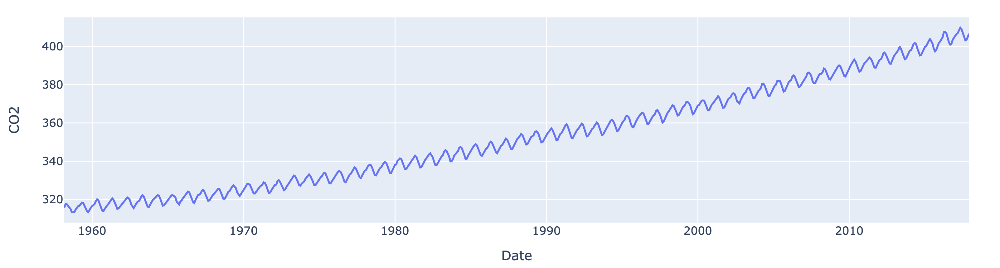

In [ ]:
#|echo: false
Image("../figure/prophet2.PNG", width=700, height=400)


列名の変更には，データフレームの**rename**メソッドを用いる．引数は**columns**で，元の列名をキーとし，変更後の列名を値とした辞書を与える．また，元のデータフレームに上書きするために，**inplace**引数を**True**に設定しておく．

In [ ]:
co2.rename(columns={"Date":"ds","CO2":"y"},inplace=True)
co2.head()

,ds,y
0,1958-03-01,315.70
1,1958-04-01,317.46
2,1958-05-01,317.51
3,1958-07-01,315.86
4,1958-08-01,314.93


**make_future_dataframe**メソッドで未来の時刻を表すデータフレームを生成する。既定値では、（予測で用いた）過去の時刻も含む。
ここでは、200ヶ月先まで予測することにする。

そのために，引数 **periods** を200に設定しておく

predict メソッドに予測したい時刻を含んだデータフレームfuture を渡すと、予測値を入れたデータフレームforecastを返す。

最後にplotメソッドで表示する．

In [ ]:
model = NeuralProphet()
metrics = model.fit(co2)
future = model.make_future_dataframe(co2, n_historic_predictions=True, periods=200)
forecast = model.predict(future)
model.set_plotting_backend("plotly")
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/222 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 45it [00:00, ?it/s]

予測は一般化加法モデルを用いて行われる．

これは，傾向変動，季節変動，イベント情報などの様々な因子の和として予測を行う方法である．

上に表示されているように，週次と日次の季節変動は無視され，年次の季節変動のみ考慮して予測している．

因子ごとに予測値の描画を行うには，`plot_components`メソッドを用いる．既定では，以下のように，上から順に傾向変動，年次の季節変動が描画される．

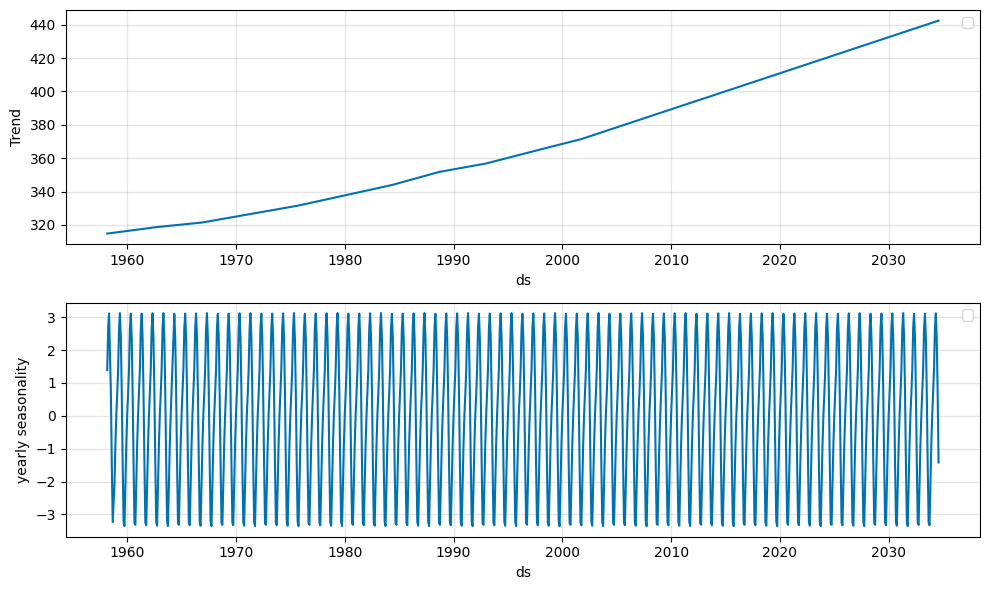

In [ ]:
model.plot_components(forecast)

### 例題：航空機乗客数のデータ

Prophetの既定値では季節変動は加法的モデルであるが、問題によっては乗法的季節変動の方が良い場合もある。
例として、航空機の乗客数を予測してみよう。最初に既定値の加法的季節変動モデルで予測し，次いで乗法的モデルで予測する．

In [ ]:
passengers = pd.read_csv("http://logopt.com/data/AirPassengers.csv")
passengers.head()

,Month,#Passengers
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121


In [ ]:
fig = px.line(passengers,x="Month",y="#Passengers")
#plotly.offline.plot(fig);

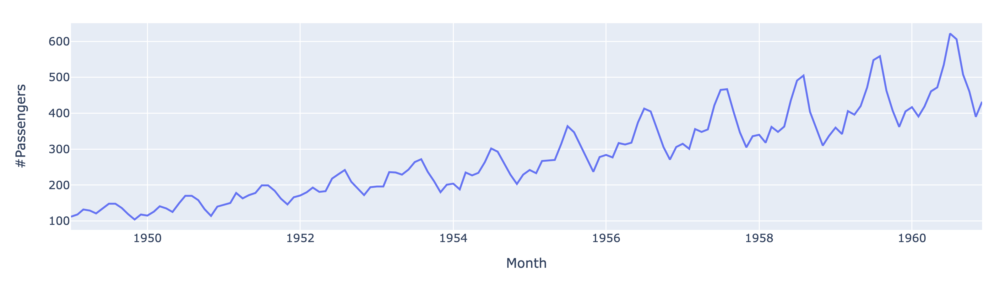

In [ ]:
#|echo: false
Image("../figure/prophet4.PNG", width=700, height=400)

In [ ]:
passengers.rename(inplace=True,columns={"Month":"ds","#Passengers":"y"})
passengers.head()

,ds,y
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121


季節変動を乗法的に変更するには， モデルの **seasonality_mode** 引数を乗法的を表す **multiplicative** に設定する．

また、モデルを作成するときに、引数**quantiles**で不確実性の幅を表示するようにする。以下では、5\%と95\%の幅を表示させている。


In [ ]:
model = NeuralProphet(quantiles=[0.05, 0.95])
metrics = model.fit(passengers)
future = model.make_future_dataframe(passengers, periods=20, n_historic_predictions=True)
forecast = model.predict(future)
model.set_plotting_backend("plotly")
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/209 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 9it [00:00, ?it/s]

In [ ]:
model = NeuralProphet(quantiles=[0.05, 0.95], seasonality_mode="multiplicative")
metrics = model.fit(passengers)
future = model.make_future_dataframe(passengers, periods=20, n_historic_predictions=True)
forecast = model.predict(future)
model.set_plotting_backend("plotly")
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/209 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 9it [00:00, ?it/s]

結果から，乗法的季節変動の方が，良い予測になっていることが確認できる．

### 問題（小売りの需要データ）

以下の，小売りの需要データを描画し，予測を行え．
ただし，モデルは乗法的季節変動で，月次で予測せよ．

In [ ]:
retail = pd.read_csv(`http://logopt.com/data/retail_sales.csv`)
retail.head()

,ds,y
0,1992-01-01,146376
1,1992-02-01,147079
2,1992-03-01,159336
3,1992-04-01,163669
4,1992-05-01,170068


In [ ]:
#|export
# retail = pd.read_csv(`http://logopt.com/data/retail_sales.csv`)
# model = Prophet(seasonality_mode=`multiplicative`).fit(retail)
# future = model.make_future_dataframe(periods=20, freq=`M`)
# forecast = model.predict(future)
# model.plot(forecast);
# #model.plot_components(forecast);

### 例題： 1時間ごとの気温データ

ここではシアトルの気温の予測を行う．


In [ ]:
climate = data.seattle_temps()
climate.head()

,date,temp
0,2010-01-01 00:00:00,39.4
1,2010-01-01 01:00:00,39.2
2,2010-01-01 02:00:00,39.0
3,2010-01-01 03:00:00,38.9
4,2010-01-01 04:00:00,38.8


このデータは， **date** 列に日付と1時間ごとの時刻が， **temp** 列に気温データが入っている．

NeuralProphetは，
日別でないデータも扱うことができる。 date列のデータ形式は、日付を表す`YYYY-MM-DD`の後に時刻を表す`HH:MM:SS`が追加されている。
未来の時刻を表すデータフレームは、`make_future_dataframe`メソッドで生成する。

In [ ]:
climate["Date"] = pd.to_datetime(climate.date)

In [ ]:
climate.rename(columns={"Date":"ds","temp":"y"},inplace=True)

In [ ]:
climate = climate[["ds","y"]] #余分な列を削除する

In [ ]:
model = NeuralProphet(daily_seasonality=True)
metrics = model.fit(climate)
future = model.make_future_dataframe(climate, periods=200, n_historic_predictions=True)
forecast = model.predict(future)
model.set_plotting_backend("plotly")
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/248 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 274it [00:00, ?it/s]

因子ごとに予測値を描画すると，傾向変動と週次の季節変動の他に，日次の季節変動（1日の気温の変化）も出力される．

In [ ]:
model.plot_components(forecast)

### 問題（サンフランシスコの気温データ）

以下のサンフランシスコの気温データを描画し，時間単位で予測を行え．

In [ ]:
sf = data.sf_temps()
sf.head()

,temp,date
0,47.8,2010-01-01 00:00:00
1,47.4,2010-01-01 01:00:00
2,46.9,2010-01-01 02:00:00
3,46.5,2010-01-01 03:00:00
4,46.0,2010-01-01 04:00:00


In [ ]:
#|export
# sf = data.sf_temps()
# sf["Date"] = pd.to_datetime(sf.date)
# sf.rename(columns={"Date":"ds","temp":"y"},inplace=True)
# model = Prophet().fit(sf)
# future = model.make_future_dataframe(periods=200, freq=`H`)
# forecast = model.predict(future)
# model.plot(forecast);

### 傾向変化点

「上昇トレンドの株価が，下降トレンドに移った」というニュースをよく耳にするだろう．このように，傾向変動は，時々変化すると仮定した方が自然なのだ．NeuralProphetでは，これを傾向変化点として処理する．再び，Peyton Manningのデータを使う．

傾向変化点の数は`n_changepoints`で指定する。既定値は $10$ である。以下では、傾向変化点を $5$ に設定する。

In [ ]:
df = pd.read_csv("http://logopt.com/data/peyton_manning.csv")
model = NeuralProphet(n_changepoints=5)
model.fit(df)
future = model.make_future_dataframe(df, periods=365, n_historic_predictions=True)
forecast = model.predict(future)
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(



Finding best initial lr:   0%|          | 0/236 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 91it [00:00, ?it/s]

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b> yhat1 <i style="color:#fc9944">~3D</i>',
              'type': 'scatter',
              'uid': '542352c2-4d53-4d4e-8851-be6a72b8b3cb',
              'x': array([datetime.datetime(2007, 12, 10, 0, 0),
                          datetime.datetime(2007, 12, 12, 0, 0),
                          datetime.datetime(2007, 12, 15, 0, 0), ...,
                          datetime.datetime(2017, 1, 14, 0, 0),
                          datetime.datetime(2017, 1, 16, 0, 0),
                          datetime.datetime(2017, 1, 19, 0, 0)], dtype=object),
              'y': array([8.7609148 , 8.31473923, 8.05177593, ..., 8.13214493, 8.84834957,
                          8.43819618])},
             {'marker': {'color': 'black', 'size': 4},
              'mode': 'markers',
              'name':

In [ ]:
model.plot_components(forecast)

FigureWidgetResampler({
    'data': [{'line': {'color': '#2d92ff', 'width': 2},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b> Trend <i style="color:#fc9944">~3D</i>',
              'showlegend': False,
              'type': 'scatter',
              'uid': '8ae725ef-ccf2-46c8-8b27-e0c1a4e711b2',
              'x': array([datetime.datetime(2007, 12, 10, 0, 0),
                          datetime.datetime(2007, 12, 13, 0, 0),
                          datetime.datetime(2007, 12, 14, 0, 0), ...,
                          datetime.datetime(2017, 1, 13, 0, 0),
                          datetime.datetime(2017, 1, 16, 0, 0),
                          datetime.datetime(2017, 1, 19, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([8.02920055, 8.0251379 , 8.02378464, ..., 7.42672253, 7.42470646,
                          7.42268944]),
              'yaxis': 'y'},
             {'line': {'color': '#2d92ff', 'width': 2},
        

傾向変化点のリストを`changepoints`引数で与えることもできる。以下の例では、1つの日だけで変化するように設定している。

In [ ]:
model = NeuralProphet(changepoints=["2014-01-01"])
model.fit(df)
future = model.make_future_dataframe(df, periods=365, n_historic_predictions=True)
forecast = model.predict(future)
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/236 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 91it [00:00, ?it/s]

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b> yhat1 <i style="color:#fc9944">~3D</i>',
              'type': 'scatter',
              'uid': '25923492-f025-48cf-9962-cc906ecc69dc',
              'x': array([datetime.datetime(2007, 12, 10, 0, 0),
                          datetime.datetime(2007, 12, 12, 0, 0),
                          datetime.datetime(2007, 12, 15, 0, 0), ...,
                          datetime.datetime(2017, 1, 14, 0, 0),
                          datetime.datetime(2017, 1, 16, 0, 0),
                          datetime.datetime(2017, 1, 19, 0, 0)], dtype=object),
              'y': array([8.57285881, 8.13311768, 7.87878942, ..., 7.65831041, 8.36783981,
                          7.95026255])},
             {'marker': {'color': 'black', 'size': 4},
              'mode': 'markers',
              'name':

In [ ]:
model.plot_components(forecast)

FigureWidgetResampler({
    'data': [{'line': {'color': '#2d92ff', 'width': 2},
              'mode': 'lines',
              'name': '<b style="color:sandybrown">[R]</b> Trend <i style="color:#fc9944">~3D</i>',
              'showlegend': False,
              'type': 'scatter',
              'uid': '3fa7beb6-a67f-4595-ad3d-bc9441da35b2',
              'x': array([datetime.datetime(2007, 12, 10, 0, 0),
                          datetime.datetime(2007, 12, 11, 0, 0),
                          datetime.datetime(2007, 12, 15, 0, 0), ...,
                          datetime.datetime(2017, 1, 14, 0, 0),
                          datetime.datetime(2017, 1, 18, 0, 0),
                          datetime.datetime(2017, 1, 19, 0, 0)], dtype=object),
              'xaxis': 'x',
              'y': array([7.83763504, 7.83794117, 7.83916378, ..., 6.94505453, 6.93939304,
                          6.93797827]),
              'yaxis': 'y'},
             {'line': {'color': '#2d92ff', 'width': 2},
        

### 例題 SP500データ

株価の予測を行う．

傾向変化点の候補は自動的に設定される。既定値では時系列の最初の80%の部分に均等に設定される。これは、モデルの**changepoint_range**引数で設定する．
この例では，期間の終わりで変化点を設定したいので，0.95に変更する．

年次の季節変動の変化の度合いは、**yearly_seasonality**（既定値は $10$) で制御できる。この例では，このパラメータを $5$ に変更することによって年間の季節変動を抑制して予測を行う．


In [ ]:
sp500 = data.sp500()
sp500.tail()

,date,price
118,2009-11-01,1095.63
119,2009-12-01,1115.10
120,2010-01-01,1073.87
121,2010-02-01,1104.49
122,2010-03-01,1140.45


In [ ]:
#|hide
# fig = px.line(sp500,x="date",y="price") 
# plotly.offline.plot(fig);

In [ ]:
sp500.rename(inplace=True,columns={"date":"ds","price":"y"})

In [ ]:
model = NeuralProphet(changepoints_range=0.95, yearly_seasonality=5)
model.fit(sp500)
future = model.make_future_dataframe(sp500, periods=20, n_historic_predictions=True)
forecast = model.predict(future)
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/208 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 8it [00:00, ?it/s]

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': 'yhat1',
              'type': 'scatter',
              'uid': '557319c6-723a-430f-a522-3205ad4fd574',
              'x': array([datetime.datetime(2000, 1, 1, 0, 0),
                          datetime.datetime(2000, 2, 1, 0, 0),
                          datetime.datetime(2000, 3, 1, 0, 0),
                          datetime.datetime(2000, 4, 1, 0, 0),
                          datetime.datetime(2000, 5, 1, 0, 0),
                          datetime.datetime(2000, 6, 1, 0, 0),
                          datetime.datetime(2000, 7, 1, 0, 0),
                          datetime.datetime(2000, 8, 1, 0, 0),
                          datetime.datetime(2000, 9, 1, 0, 0),
                          datetime.datetime(2000, 10, 1, 0, 0),
                          datetime.datetime(2000, 11, 1, 0, 0),
                       

In [ ]:
model.plot_components(forecast)

FigureWidgetResampler({
    'data': [{'line': {'color': '#2d92ff', 'width': 2},
              'mode': 'lines',
              'name': 'Trend',
              'showlegend': False,
              'type': 'scatter',
              'uid': 'f570cfaf-7495-494a-b82a-81bc96c3aa7e',
              'x': array([datetime.datetime(2000, 1, 1, 0, 0),
                          datetime.datetime(2000, 2, 1, 0, 0),
                          datetime.datetime(2000, 3, 1, 0, 0),
                          datetime.datetime(2000, 4, 1, 0, 0),
                          datetime.datetime(2000, 5, 1, 0, 0),
                          datetime.datetime(2000, 6, 1, 0, 0),
                          datetime.datetime(2000, 7, 1, 0, 0),
                          datetime.datetime(2000, 8, 1, 0, 0),
                          datetime.datetime(2000, 9, 1, 0, 0),
                          datetime.datetime(2000, 10, 1, 0, 0),
                          datetime.datetime(2000, 11, 1, 0, 0),
                          datetime

### 例題： 個別銘柄の株価の予測

stocksデータでは，symbol列に企業コードが入っている．

- AAPL アップル
- AMZN アマゾン
- IBM  IBM
- GOOG グーグル
- MSFT マイクロソフト

まずは可視化を行う。

In [ ]:
stocks = data.stocks()
stocks.tail()

,symbol,date,price
555,AAPL,2009-11-01,199.91
556,AAPL,2009-12-01,210.73
557,AAPL,2010-01-01,192.06
558,AAPL,2010-02-01,204.62
559,AAPL,2010-03-01,223.02


In [ ]:
fig = px.line(stocks,x="date",y="price",color="symbol")
#plotly.offline.plot(fig);

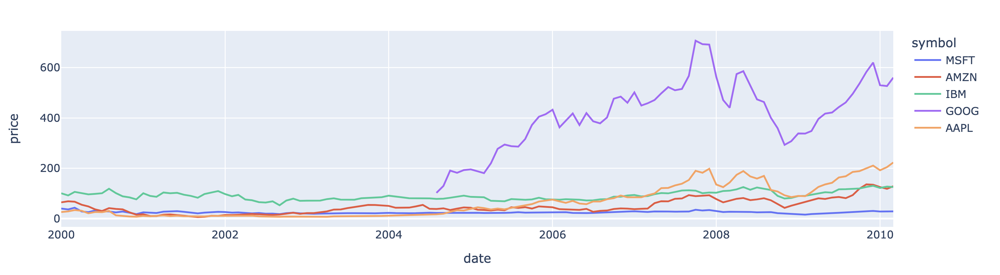

In [ ]:
#|echo: false
Image("../figure/prophet5.PNG", width=700, height=400)

以下では，マイクロソフトの株価を予測してみる．

In [ ]:
msft = stocks[stocks.symbol == "MSFT"]
msft.head()

,symbol,date,price
0,MSFT,2000-01-01,39.81
1,MSFT,2000-02-01,36.35
2,MSFT,2000-03-01,43.22
3,MSFT,2000-04-01,28.37
4,MSFT,2000-05-01,25.45


In [ ]:
msft = msft.rename(columns={"date":"ds","price":"y"})
msft = msft[["ds","y"]]
msft.head()

,ds,y
0,2000-01-01,39.81
1,2000-02-01,36.35
2,2000-03-01,43.22
3,2000-04-01,28.37
4,2000-05-01,25.45


In [ ]:
model = NeuralProphet(changepoints_range=0.95,yearly_seasonality=5)
model.fit(msft)
future = model.make_future_dataframe(msft, periods=20, n_historic_predictions=True)
forecast = model.predict(future)
model.plot(forecast)

WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/208 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 8it [00:00, ?it/s]

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': 'rgba(45, 146, 255, 1.0)', 'width': 2},
              'mode': 'lines',
              'name': 'yhat1',
              'type': 'scatter',
              'uid': '5e428c24-2d3b-4268-a95b-67907df953a1',
              'x': array([datetime.datetime(2000, 1, 1, 0, 0),
                          datetime.datetime(2000, 2, 1, 0, 0),
                          datetime.datetime(2000, 3, 1, 0, 0),
                          datetime.datetime(2000, 4, 1, 0, 0),
                          datetime.datetime(2000, 5, 1, 0, 0),
                          datetime.datetime(2000, 6, 1, 0, 0),
                          datetime.datetime(2000, 7, 1, 0, 0),
                          datetime.datetime(2000, 8, 1, 0, 0),
                          datetime.datetime(2000, 9, 1, 0, 0),
                          datetime.datetime(2000, 10, 1, 0, 0),
                          datetime.datetime(2000, 11, 1, 0, 0),
                       

In [ ]:
#model.plot_components(forecast)
model.plot_parameters(forecast)

FigureWidgetResampler({
    'data': [{'fill': 'none',
              'line': {'color': '#2d92ff', 'width': 2},
              'mode': 'lines',
              'name': 'Trend',
              'type': 'scatter',
              'uid': 'ce0685f6-ac0e-44dd-8841-0ffd37c2e676',
              'x': array([datetime.datetime(2000, 1, 1, 0, 0),
                          datetime.datetime(2000, 2, 1, 0, 0),
                          datetime.datetime(2000, 3, 1, 0, 0),
                          datetime.datetime(2000, 4, 1, 0, 0),
                          datetime.datetime(2000, 5, 1, 0, 0),
                          datetime.datetime(2000, 6, 1, 0, 0),
                          datetime.datetime(2000, 7, 1, 0, 0),
                          datetime.datetime(2000, 8, 1, 0, 0),
                          datetime.datetime(2000, 9, 1, 0, 0),
                          datetime.datetime(2000, 10, 1, 0, 0),
                          datetime.datetime(2000, 11, 1, 0, 0),
                          datetime.date

### 問題（株価）

上の株価データのマイクロソフト以外の銘柄を1つ選択し，予測を行え．

In [ ]:
stocks = data.stocks()
stocks.head()

,symbol,date,price
0,MSFT,2000-01-01,39.81
1,MSFT,2000-02-01,36.35
2,MSFT,2000-03-01,43.22
3,MSFT,2000-04-01,28.37
4,MSFT,2000-05-01,25.45


In [ ]:
#|export
# stocks = data.stocks()
# amzn = stocks[ stocks.symbol == "AMZN"]
# amzn = amzn.rename(columns={"date":"ds","price":"y"})
# model = Prophet(changepoint_prior_scale=0.5, changepoint_range=0.95, yearly_seasonality=5).fit(amzn)
# future = model.make_future_dataframe(periods=200, freq=`D`)
# forecast = model.predict(future)
# model.plot(forecast);

## 発展編

以下では，NeuralProphetの高度な使用法を解説する．


### 自己回帰による予測

以下の例は、スペインの4年間のエネルギー価格である。
直近の $p$ 日前までのデータの重み付きの和の項を追加するのが、自己回帰モデルである。
$p$ を表す**n_legs**引数を設定すると、自己回帰項が追加される。

In [ ]:
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")
df.head()

,ds,y
0,2014-12-31,65.41
1,2015-01-01,62.09
2,2015-01-02,69.44
3,2015-01-03,65.22
4,2015-01-04,58.91


WARNING - (py.warnings._showwarnmsg) - /Users/mikiokubo/Library/Caches/pypoetry/virtualenvs/analytics2-0ZiTWol9-py3.9/lib/python3.9/site-packages/pytorch_lightning/trainer/setup.py:201: UserWarning:

MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.




Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 46it [00:00, ?it/s]

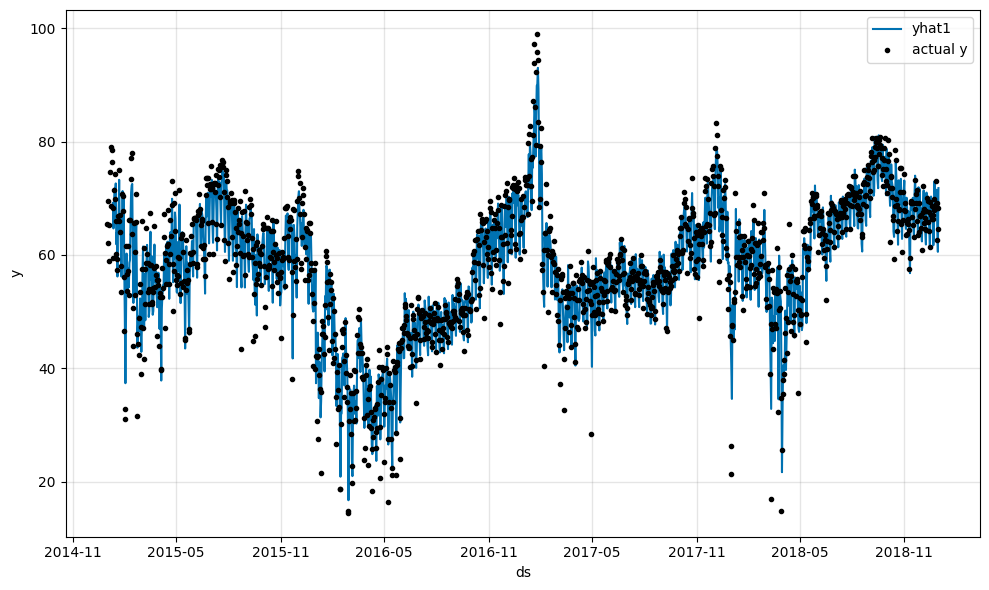

In [ ]:
model = NeuralProphet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    n_lags=10
)
model.set_plotting_backend("matplotlib")
metrics = model.fit(df)
forecast = model.predict(df)
model.plot(forecast)

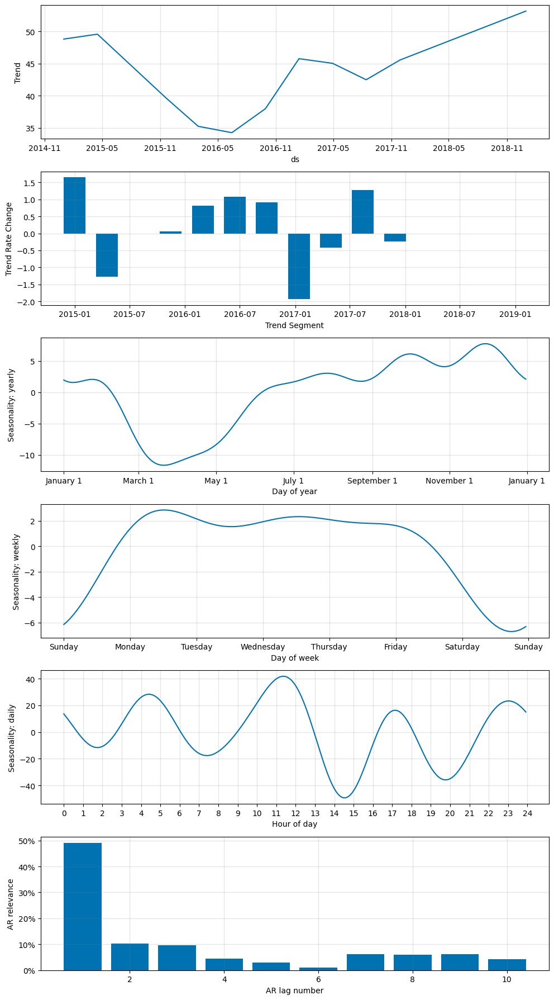

In [ ]:
model.plot_parameters()

### 休日（特別なイベント）を考慮した予測

休日や特別なイベントをモデルに追加することを考える。

モデルインスタンスの**add_country_holidays**メソッドを用いて，各国（州）の休日データを追加することができる。
引数は [python-holidays](https://python-holidays.readthedocs.io/en/latest/) にある文字列で、
たとえば米国の場合には`US`、スペインの場合には`ES`を指定する。

In [ ]:
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")
df.head()

,ds,y
0,2014-12-31,65.41
1,2015-01-01,62.09
2,2015-01-02,69.44
3,2015-01-03,65.22
4,2015-01-04,58.91


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 46it [00:00, ?it/s]

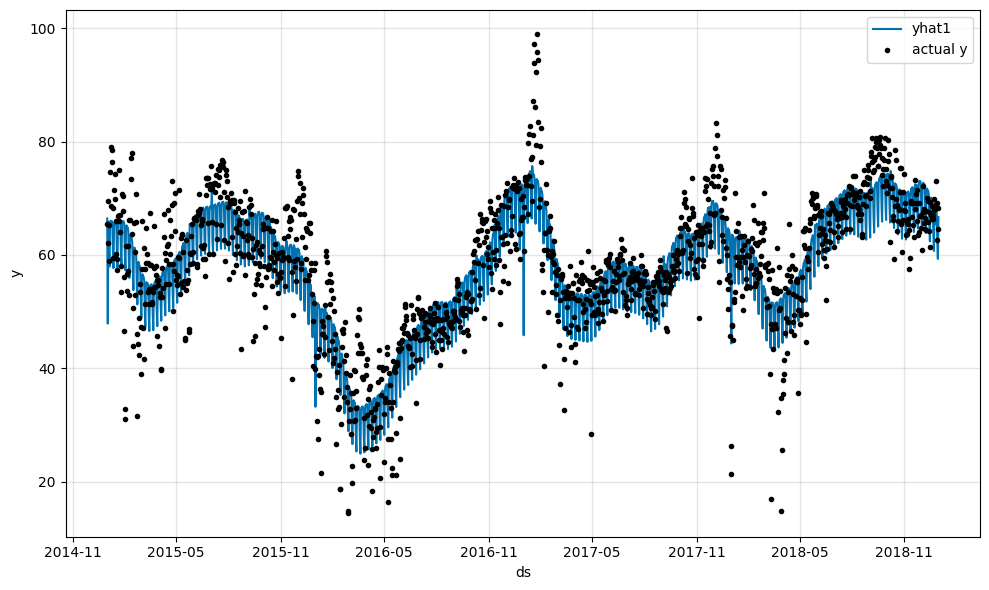

In [ ]:
model = NeuralProphet()
model.set_plotting_backend("matplotlib")
model = model.add_country_holidays("US")
metrics = model.fit(df)
forecast = model.predict(df)
model.plot(forecast)

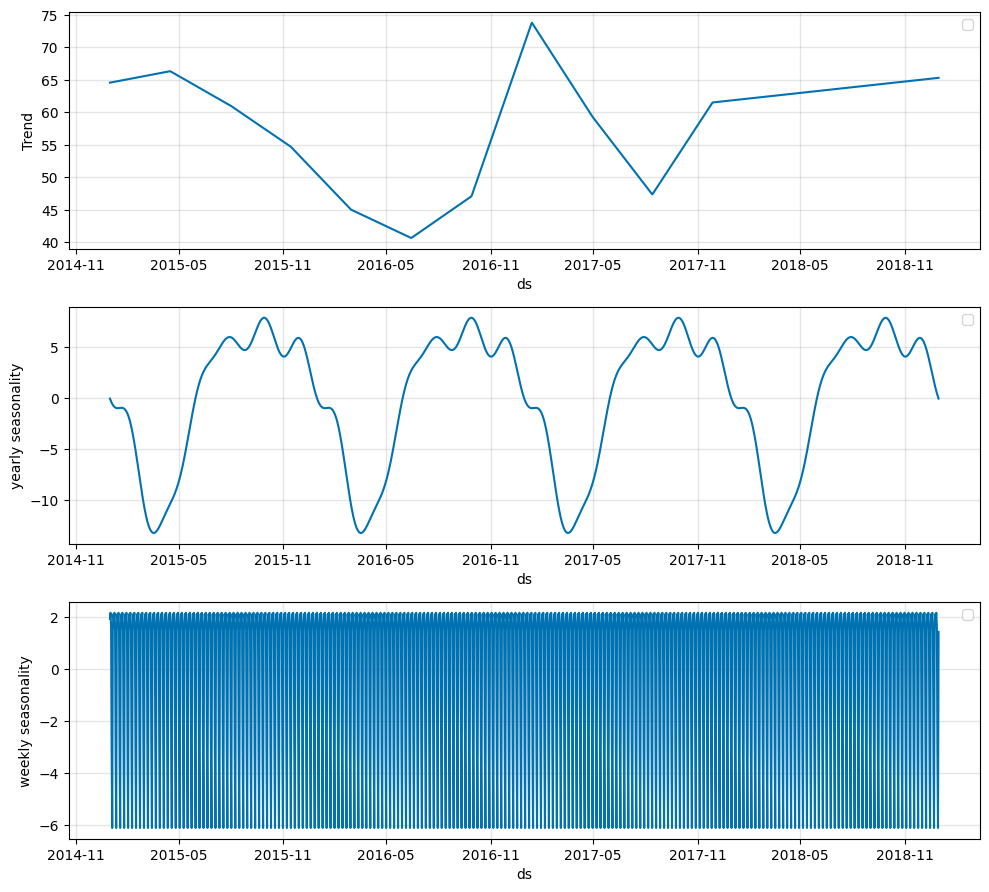

In [ ]:
model.plot_components(forecast)

悪天候(`extreme_weather`)を表すデータフレームを与えることによって、特別なイベントを考慮した予測を行うことができる。
データフレームは`event`と`ds`の列をもち、それを**add_events**メソッドで追加する。
その後、**create_df_with_events**でイベントが追加されたデータフレームを生成する。

In [ ]:
df_events = pd.DataFrame(
    {
        "event": "extreme_weather",
        "ds": pd.to_datetime(
            [
                "2018-11-23",
                "2018-11-17",
                "2018-10-28",
                "2018-10-18",
                "2018-10-14",
            ]
        ),
    }
)
df_events.head()

,event,ds
0,extreme_weather,2018-11-23
1,extreme_weather,2018-11-17
2,extreme_weather,2018-10-28
3,extreme_weather,2018-10-18
4,extreme_weather,2018-10-14


In [ ]:
model = NeuralProphet()
model.set_plotting_backend("matplotlib")
model.add_events("extreme_weather")
df_all = model.create_df_with_events(df, df_events)
df_all.head()

,ds,y,extreme_weather
0,2014-12-31,65.41,0.0
1,2015-01-01,62.09,0.0
2,2015-01-02,69.44,0.0
3,2015-01-03,65.22,0.0
4,2015-01-04,58.91,0.0


プレーオフやスーパーボールなどのイベント効果がある日だけ抜き出してデータフレームを表示する．

Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 46it [00:00, ?it/s]

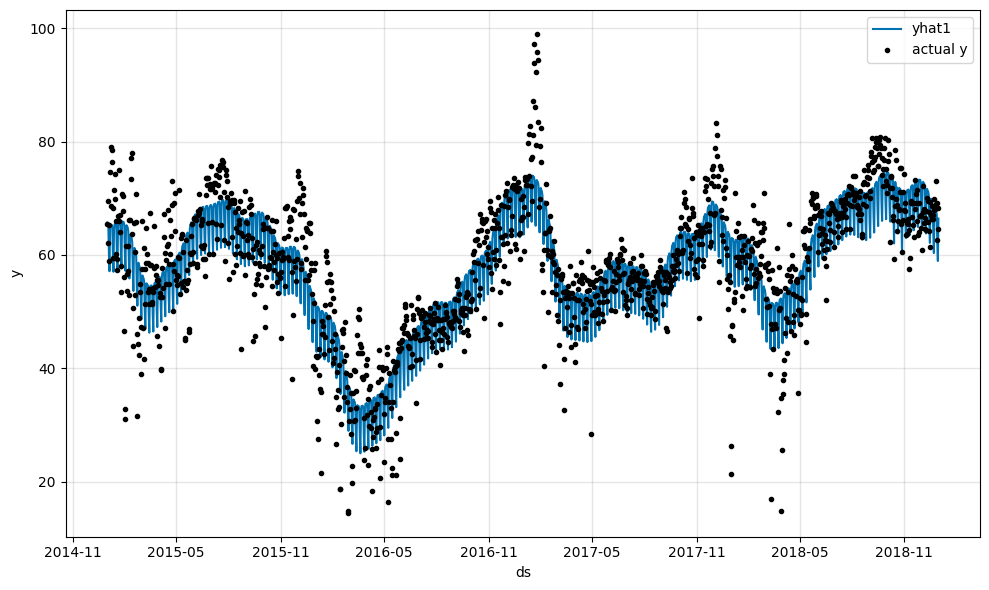

In [ ]:
metrics = model.fit(df_all)
forecast = model.predict(df_all)
model.plot(forecast)

In [ ]:
forecast

,ds,y,yhat1,trend,season_yearly,season_weekly,events_additive,event_extreme_weather
0,2014-12-31,65.41,66.037766,64.217842,-0.153455,1.973382,0.0,0.0
1,2015-01-01,62.09,66.027626,64.230774,-0.279848,2.076697,0.0,0.0
2,2015-01-02,69.44,65.489098,64.243706,-0.389916,1.635309,0.0,0.0
3,2015-01-03,65.22,60.684303,64.256638,-0.483619,-3.088721,0.0,0.0
4,2015-01-04,58.91,57.556625,64.269577,-0.561093,-6.151851,0.0,0.0
...,...,...,...,...,...,...,...,...
1457,2018-12-27,72.96,68.505104,65.919891,0.508521,2.076697,0.0,0.0
1458,2018-12-28,69.23,67.888680,65.932701,0.320673,1.635309,0.0,0.0
1459,2018-12-29,62.62,63.004066,65.945511,0.147277,-3.088721,0.0,0.0
1460,2018-12-30,64.57,59.795517,65.958313,-0.010950,-6.151851,0.0,0.0


### 外生変数の追加

外生変数である気温**temperature**を利用してエネルギー価格の予測を行う。

ここでは、$q$ 日前までの気温がエネルギー価格に影響を与える時間遅れ（ラグ）モデルを用いる。
モデルインスタンスの**addd_lagged_regressor**メソッドを用いる。
引数は列名もしくは列名のリストである。時間遅れのパラメータ $q$ は引数**n_lags**で与える。

また、未来の気温が既知であると仮定した場合には、気温を外生変数とした回帰項を追加する。
これには、モデルインスタンスの **add_future_regressor**を用いる。
引数は列名もしくは列名のリストである。

In [ ]:
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial04.csv")
df.head()

,ds,y,temperature
0,2015-01-01,64.92,277.00
1,2015-01-02,58.46,277.95
2,2015-01-03,63.35,278.83
3,2015-01-04,50.54,279.64
4,2015-01-05,64.89,279.05


Finding best initial lr:   0%|          | 0/229 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 46it [00:00, ?it/s]

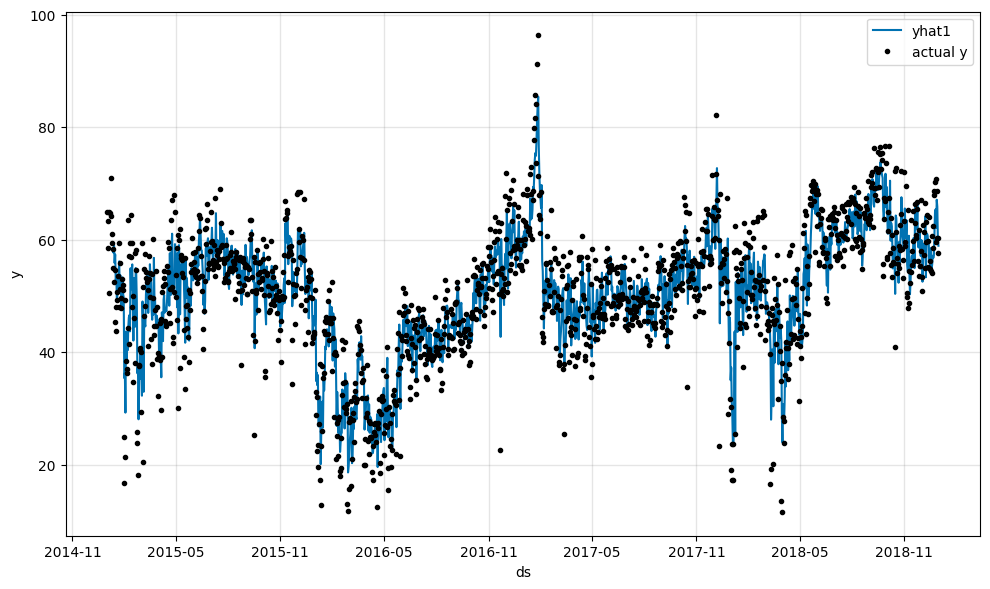

In [ ]:
model = NeuralProphet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    n_lags=10
)
model.set_plotting_backend("matplotlib")
#model.add_lagged_regressor("temperature", n_lags=5)
model.add_future_regressor("temperature")
metrics = model.fit(df)
forecast = model.predict(df)
model.plot(forecast)

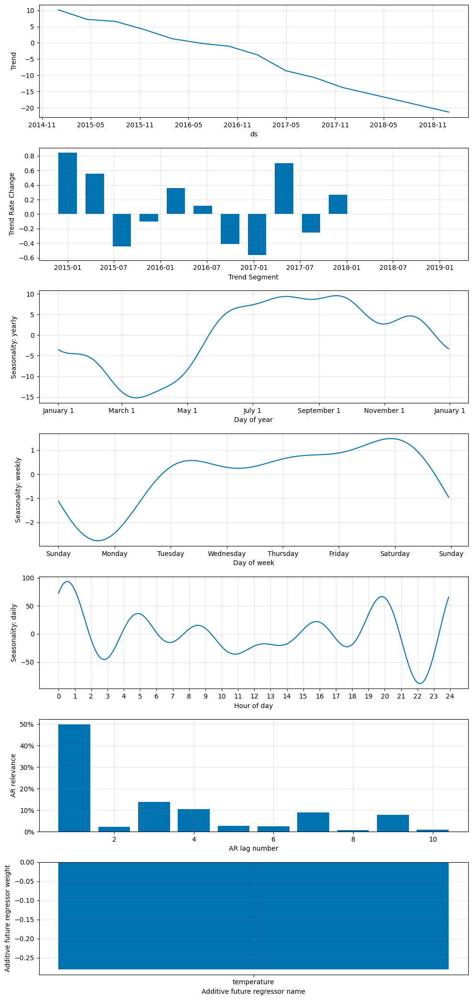

In [ ]:
model.plot_parameters()

### ユーザーが設定した季節変動

Prophetでは既定値の年次や週次の季節変動だけでなく、ユーザー自身で季節変動を定義・追加できる。以下では、週次の季節変動を除き，かわりに周期が30.5日の月次変動をフーリエ次数（seasonalityの別名）5として追加している。

11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing


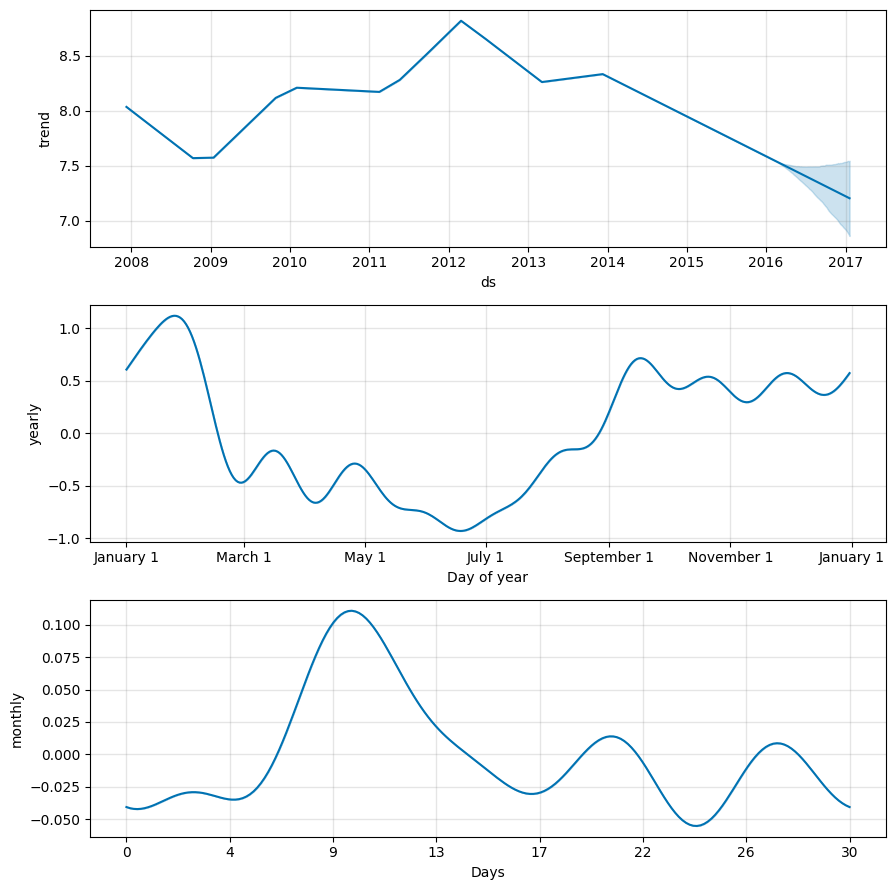

In [ ]:
model = Prophet(weekly_seasonality=False)
model.add_seasonality(name=`monthly`, period=30.5, fourier_order=5)
model.fit(df)
future = model.make_future_dataframe(periods=365)
forecast = model.predict(future)
model.plot_components(forecast);

### 他の要因に依存した季節変動

他の要因に依存した季節変動も定義・追加することができる。以下の例では、オンシーズンとオフシーズンごと週次変動を定義し、追加してみる。

In [ ]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 8 or date.month < 2)
df[`on_season`] = df[`ds`].apply(is_nfl_season)
df[`off_season`] = ~df[`ds`].apply(is_nfl_season)

11:38:48 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing


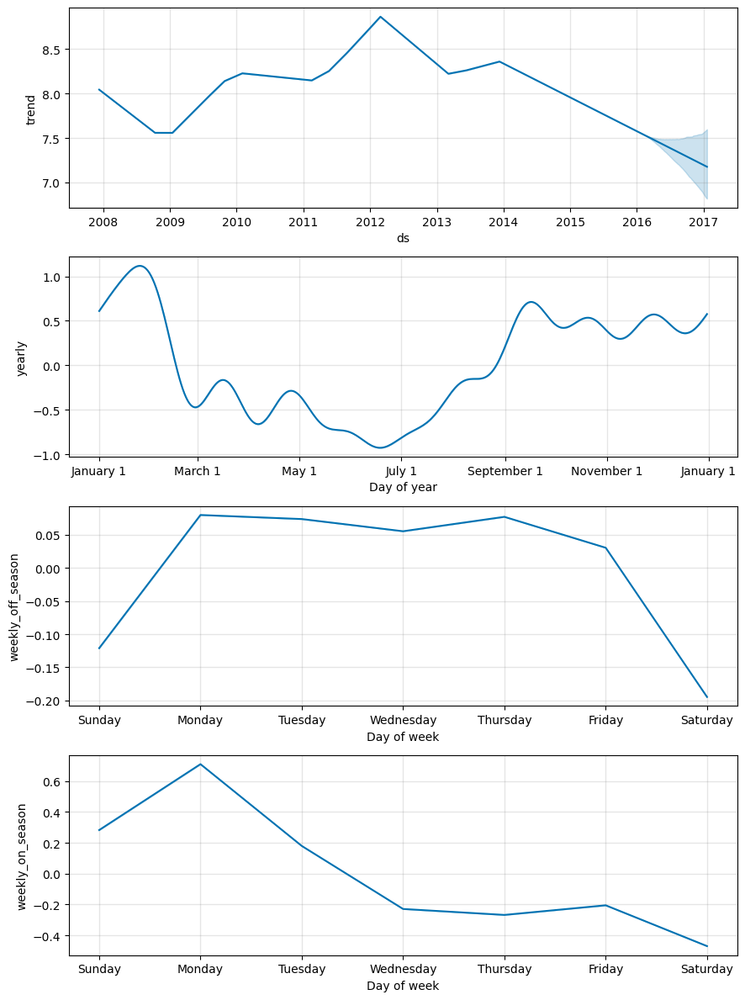

In [ ]:
model = Prophet(weekly_seasonality=False)
model.add_seasonality(name=`weekly_on_season`, period=7, fourier_order=3, condition_name=`on_season`)
model.add_seasonality(name=`weekly_off_season`, period=7, fourier_order=3, condition_name=`off_season`)
model.fit(df)
future = model.make_future_dataframe(periods=365)
future[`on_season`] = future[`ds`].apply(is_nfl_season)
future[`off_season`] = ~future[`ds`].apply(is_nfl_season)
forecast =model.predict(future)
model.plot_components(forecast);


## 主なパラメータと既定値

以下にNeuralProphetの主要なパラメータ（引数）とその既定値を示す．

- changepoints=None :  傾向変更点のリスト
- changepoint_range = $0.8$ : 傾向変化点の候補の幅（先頭から何割を候補とするか）
- n_changepoints=25 : 傾向変更点の数
- yearly_seasonality=`auto` :  年次の季節変動を考慮するか否か
- weekly_seasonality=`auto` : 週次の季節変動を考慮するか否か
- daily_seasonality=`auto` : 日次の季節変動を考慮するか否か
- seasonality_prior_scale= $10.0$ : 季節変動の事前分布のスケール値（パラメータの柔軟性を表す）
- holidays_prior_scale= $10.0$ : 休日のの事前分布のスケール値（パラメータの柔軟性を表す）
- changepoint_prior_scale= $0.05$ :  傾向変更点の事前分布のスケール値（パラメータの柔軟性を表す）
- mcmc_samples= $0$ : MCMC法のサンプル数
- interval_width= $0.8$ : 不確実性の幅 
- uncertainty_samples= $1000$ : 不確実性の幅を計算する際のサンプル数
